# Контрольная работа 2

### Подгружаем все

In [ ]:
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

import seaborn as sns
sns.set(font_scale=1.3, style='whitegrid', palette='Set2')
from IPython.display import display

import numpy as np
import numpy.linalg as la
import pandas as pd
import scipy.stats as sps
from scipy.spatial import KDTree

# load and show an image with Pillow
from PIL import Image

import copy
import random
import os

from time import time, sleep
from datetime import datetime

import math
from tqdm.notebook import tqdm

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

import cvxpy as cvx
print(cvx.installed_solvers())

['CVXOPT', 'ECOS', 'ECOS_BB', 'GLPK', 'GLPK_MI', 'OSQP', 'SCS']


In [1]:
from google.colab import drive 
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [2]:
%ls
%cd 'gdrive/MyDrive/mipt-opt/kr2'

gdrive/  sample_data/
/content/gdrive/MyDrive/mipt-opt/kr2


In [4]:
%%shell
jupyter nbconvert --to html mipt-opt-kr2.ipynb

[NbConvertApp] Converting notebook mipt-opt-kr2.ipynb to html
[NbConvertApp] Writing 10876870 bytes to mipt-opt-kr2.html


In [ ]:
import builtins

class Mocking(object):
    def __init__(self, new_print):
        self.new_print = new_print
        self.real_print = builtins.print
    
    def __enter__(self):
        builtins.print = self.new_print
        return self

    def __exit__(self, exc_type, exc_val, exc_tb):
        builtins.print = self.real_print

class MockPrint(object):
    def __init__(self, real_print=builtins.print):
        self.real_print = real_print
        self.prev_time = None
    
    def __call__(self, *args, **kwargs):
        arg = datetime.now().time() if self.prev_time is None else datetime.now() - self.prev_time
        self.real_print(f'[{str(arg):>15}]', *args, **kwargs)

    def tik(self):
        self.prev_time = datetime.now()

with Mocking(MockPrint()):
    print('Hello')
    print.tik()
    print("Hello")
    sleep(0.5)
    print("Hello")

print("Hello")

[18:29:25.318803] Hello
[ 0:00:00.000005] Hello
[ 0:00:00.500674] Hello
Hello


In [ ]:
def MockingPrint(mock, tik=True):
    def decorator(function):
        def wrapper(*args, **kwargs):
            with Mocking(mock):
                if tik:
                    print.tik()
                return function(*args, **kwargs)
        return wrapper
    return decorator

### Подгрузка и визуализация изображений

In [ ]:
%ls demo

CAMNS_LP.m  cao1.jpg  demo_CAMNS_LP.m  is_ext_pt.m  ksiwek1.jpg  zhang1.jpg


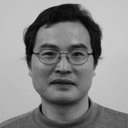

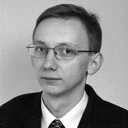

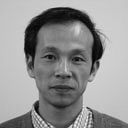

In [ ]:
cao = Image.open('demo/cao1.jpg')
ksiwek = Image.open('demo/ksiwek1.jpg')
zhang = Image.open('demo/zhang1.jpg')

display(cao, ksiwek, zhang)

In [ ]:
def mix_images(images, coef):
    return np.dot(np.array(images).T, coef).T

def show_images(images, adjust=False, figsize=(15, 9), shape=None, imshow_params=dict()):
    images = np.array(images)
    if shape is None:
        N = int(np.ceil(np.sqrt(images.shape[0])))
        M = int(np.floor(images.shape[0] / N))
    else:
        N = shape[0]
        M = shape[1]
    
    if adjust:
        figsize=(figsize[0], figsize[0] * N / M)
    
    fig, axs = plt.subplots(N, M, figsize=figsize)
    axs = axs.flatten()

    for im, ax in zip(images, axs):
        ax.imshow(im, **imshow_params)
        ax.axis('off')

    plt.subplots_adjust(wspace=0.0, hspace=0.0)
    plt.tight_layout(w_pad=0.0, h_pad=0.0)
    plt.show()

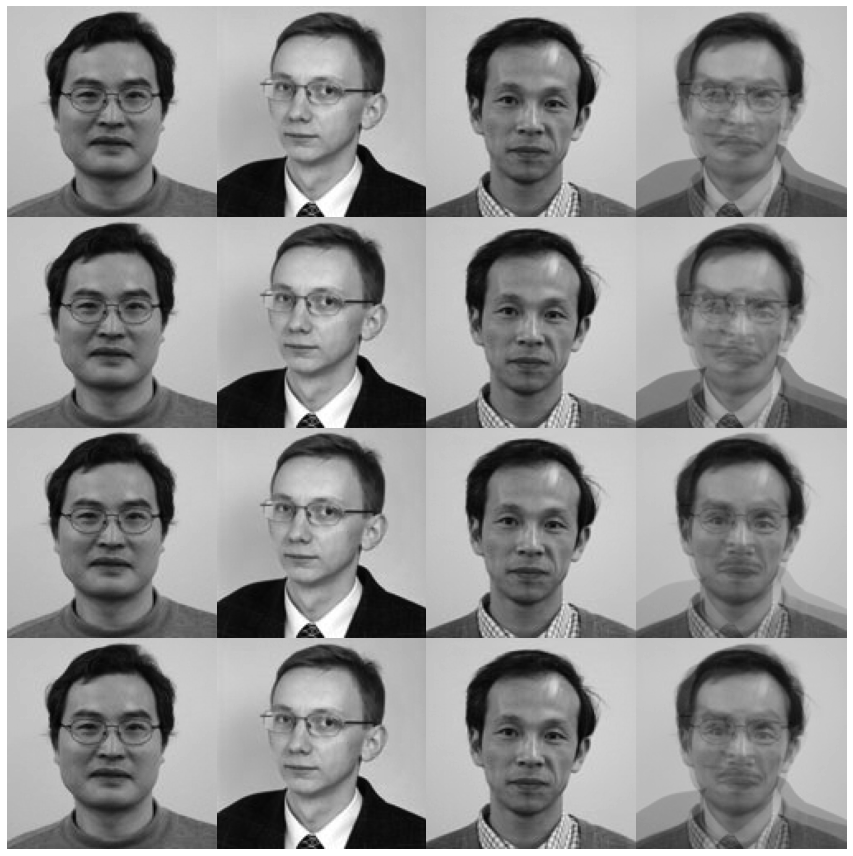

In [ ]:
guys = [
    np.asarray(Image.open('demo/cao1.jpg')),
    np.asarray(Image.open('demo/ksiwek1.jpg')),
    np.asarray(Image.open('demo/zhang1.jpg'))
]

images = []
for _ in range(4):
    images = images + guys

    alphas = np.random.uniform(size=3)
    alphas = alphas / alphas.sum()

    images.append(mix_images(guys, alphas))

show_images(images, adjust=True, figsize=(12, 12), shape=(4, 4), imshow_params={'cmap':'gray', 'vmin':0.0, 'vmax':255.0})

### Датасеты

#### Cifar

(картинки не очень детализированные, поэтому из эстетических соображений с ним работать не будем)

In [ ]:
!wget "http://www.cs.toronto.edu/~kriz/cifar-10-python.tar.gz" -O cifar-10-python.tar.gz

--2021-12-02 19:41:46--  http://www.cs.toronto.edu/~kriz/cifar-10-python.tar.gz
Resolving www.cs.toronto.edu (www.cs.toronto.edu)... 128.100.3.30
Connecting to www.cs.toronto.edu (www.cs.toronto.edu)|128.100.3.30|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 170498071 (163M) [application/x-gzip]
Saving to: ‘cifar-10-python.tar.gz’

cifar-10-python.tar 100%[===================>] 162.60M  48.2MB/s    in 3.5s    

2021-12-02 19:41:50 (46.9 MB/s) - ‘cifar-10-python.tar.gz’ saved [170498071/170498071]



In [ ]:
%mv cifar-10-python.tar.gz cifar.tar.gz
%ls

cifar-10-batches-py/  demo/        Linnaeus.rar       mipt-opt-kr2.ipynb
cifar.tar.gz          linna_data/  mipt-opt-kr2.html  Sk_NMF.pptx


In [ ]:
!tar -xvzf "cifar.tar.gz"

cifar-10-batches-py/
cifar-10-batches-py/data_batch_4
cifar-10-batches-py/readme.html
cifar-10-batches-py/test_batch
cifar-10-batches-py/data_batch_3
cifar-10-batches-py/batches.meta
cifar-10-batches-py/data_batch_2
cifar-10-batches-py/data_batch_5
cifar-10-batches-py/data_batch_1


In [ ]:
def unpickle(file):
    import pickle
    with open(file, 'rb') as fo:
        dict = pickle.load(fo, encoding='bytes')
    return dict

In [ ]:
cifar_images = unpickle('cifar-10-batches-py/data_batch_1')[b'data']
cifar_images

array([[ 59,  43,  50, ..., 140,  84,  72],
       [154, 126, 105, ..., 139, 142, 144],
       [255, 253, 253, ...,  83,  83,  84],
       ...,
       [ 71,  60,  74, ...,  68,  69,  68],
       [250, 254, 211, ..., 215, 255, 254],
       [ 62,  61,  60, ..., 130, 130, 131]], dtype=uint8)

In [ ]:
cifar_images = cifar_images.reshape((10000, 3, 32, 32))
cifar_images.shape

(10000, 3, 32, 32)

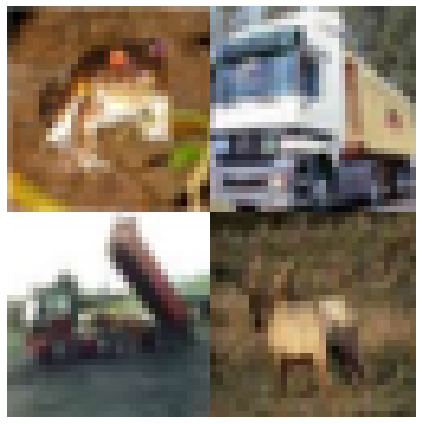

In [ ]:
batch = np.swapaxes(np.swapaxes(cifar_images[0:4],1,2), 2, 3)
show_images(batch, adjust=True, figsize=(6, 6), shape=(2, 2))

#### Linnaeus

In [ ]:
!wget "http://chaladze.com/l5/img/Linnaeus 5 128X128.rar" -O 'Linnaeus 5 128X128.rar'

--2021-12-03 19:40:09--  http://chaladze.com/l5/img/Linnaeus%205%20128X128.rar
Resolving chaladze.com (chaladze.com)... 74.208.236.157, 2607:f1c0:100f:f000::25c
Connecting to chaladze.com (chaladze.com)|74.208.236.157|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 138983573 (133M) [application/rar]
Saving to: ‘Linnaeus 5 128X128.rar’

Linnaeus 5 128X128. 100%[===================>] 132.54M  43.7MB/s    in 3.3s    

2021-12-03 19:40:12 (39.8 MB/s) - ‘Linnaeus 5 128X128.rar’ saved [138983573/138983573]



In [ ]:
%mv 'Linnaeus 5 128X128.rar' Linnaeus.rar
%ls

cifar-10-batches-py/  linna_data/       mipt-opt-kr2.html
cifar.tar.gz          linna_data_test/  mipt-opt-kr2.ipynb
demo/                 Linnaeus.rar      Sk_NMF.pptx


In [ ]:
%ls

cifar-10-batches-py/  demo/        Linnaeus.rar       mipt-opt-kr2.ipynb
cifar.tar.gz          linna_data/  mipt-opt-kr2.html  Sk_NMF.pptx


In [ ]:
!mkdir linna_data
!unrar x Linnaeus.rar ./linna_data

In [ ]:
path = 'linna_data'
linna_image_paths = []

for root, dirs, files in os.walk(path):
	for file in files:
		linna_image_paths.append(os.path.join(root,file))

In [ ]:
len(linna_image_paths)

8000

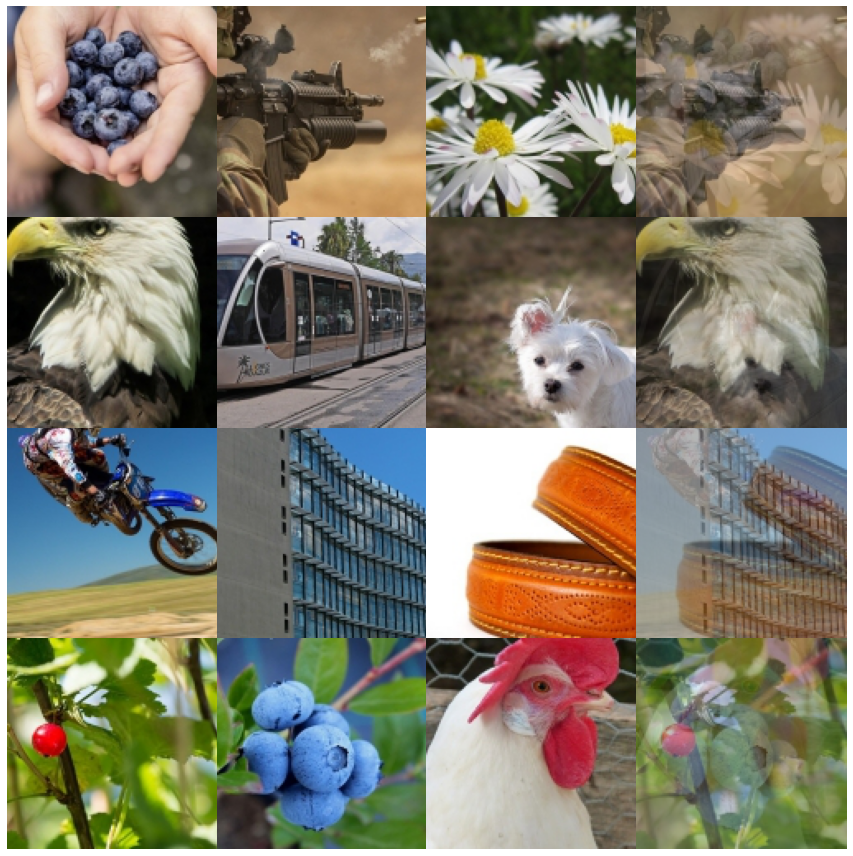

In [ ]:
N = 3
M = 4

images = []
for _ in range(M):
    new_images = [np.asarray(Image.open(path)) / 255 for path in np.random.choice(linna_image_paths, N, replace=False)]
    images = images + new_images

    alphas = np.random.uniform(size=N)
    alphas = alphas / alphas.sum()

    images.append(mix_images(new_images, alphas))

show_images(images, adjust=True, figsize=(12, 12), shape=(M, N + 1))

### Небольшая тренировка и вводные по `cvxpy`

Функция, которая понадобится в алгоритме

In [ ]:
def solve_LP(r, C, d, ProblemType=cvx.Minimize, solve_params=dict()):
    L = C.shape[1]
    alpha = cvx.Variable(L)
    constraints = [ C @ alpha + d >= 0 ]
    obj = ProblemType(r @ (C @ alpha + d))
    prob = cvx.Problem(obj, constraints=constraints)
    prob.solve(**solve_params)

    return prob.value, alpha.value

In [ ]:
C = np.array([
    [1, 0],
    [0, 1],
    [-1, -1]
])

d = np.array([-2, -2, 8])
params = {'verbose':False}

r = np.array([0, 0, 1])
p, alpha = solve_LP(r, C, d, solve_params=params)
p, alpha

In [ ]:
r = np.array([1, 0, 0])
p, alpha = solve_LP(r, C, d, solve_params=params)
p, alpha

In [ ]:
r = np.array([0, 1, 0])
p, alpha = solve_LP(r, C, d, solve_params=params)
p, alpha

In [ ]:
r = np.array([1, 1, 0])
p, alpha = solve_LP(r, C, d, ProblemType=cvx.Maximize, solve_params=params)
p, alpha

In [ ]:
r = np.array([1, 1, 1])
solve_LP(r, C, d, ProblemType=cvx.Maximize, solve_params=params), solve_LP(r, C, d, ProblemType=cvx.Minimize, solve_params=params)  # направление перпендикулярно плоскости

### Алгоритм

In [ ]:
def svd_solve(svd_solver, A, k=None, vectors=True, **kwargs):
    import scipy.linalg as sla
    import numpy.linalg as la
    import scipy.sparse.linalg as spla

    if svd_solver == 'numpy':
        if vectors != False:
            U, S, Vh = la.svd(A, compute_uv=True, **kwargs)
        else:
            S = la.svd(A, compute_uv=False, **kwargs)
    elif svd_solver == 'scipy':
        if vectors != False:
            U, S, Vh = sla.svd(A, compute_uv=True, **kwargs)
        else:
            S = sla.svd(A, compute_uv=False, **kwargs)
    elif svd_solver == 'scipy.sparse':
        if k is None:
            raise ValueError("Incorrect k for scipy.sparse.svds")
        U, S, Vh = spla.svds(A, k=k, return_singular_vectors=vectors, **kwargs)
    else:
        raise ValueError("Incorrect solver")

    if vectors == 'u':
        return U, S
    elif vectors == 'vh':
        return S, Vh
    elif vectors == True:
        return U, S, Vh
    return S

In [ ]:
def solve_LP(r, C, d, ProblemType=cvx.Minimize, solve_params=dict(), verbose=True):
    if verbose:
        print(f'Searching LP solution')

    L = C.shape[1]
    alpha = cvx.Variable(L)
    constraints = [ C @ alpha + d >= 0 ]
    obj = ProblemType(r @ (C @ alpha + d))
    prob = cvx.Problem(obj, constraints=constraints)
    prob.solve(**solve_params)

    if verbose:
        print(f'Found LP solution: {alpha.value}, value = {prob.value}')

    return prob.value, alpha.value

In [ ]:
def is_exp_pt(C, d, alpha, tol=1e-6, verbose=True):
    '''
    Verify if alpha is an extreme point of the polyhedral set
    { alpha | C@alpha + d >= 0 }

    :param (C, d) - the set of polyhedron parameter
    :param alpha - the point to be tested
    :param tol - specifies the numerical tolerance
    :return Is alpha an extreme point
    :rtype bool
    '''
    if verbose:
        print(f'Checking if extreme point: {alpha}')

    T = C[(np.abs(C@alpha + d) < tol), :]

    s = svd_solve('numpy', T, vectors=False)
    s = np.abs(s)
    temp = s / s.sum()
    return np.sum(temp > tol) == C.shape[1]

In [ ]:
def get_affine_set(X, N, tol=1e-6, svd_solver='numpy', verbose=True):
    '''
    Generate an affine set (C, d) from matrix
    of observations x
    '''
    if verbose:
        print(f'Generating (C, d) affine set')
    index = np.abs(X).sum(axis=1) > tol
    Xn = X[index, :]

    d = Xn.mean(axis=1)
    params = {'which':'LM'} if svd_solver == 'scipy.sparse' else {'full_matrices':True}
    C, _ = svd_solve(svd_solver, Xn - d[:, np.newaxis], k=N-1, vectors='u', **params)
    C = C[:, :N - 1]

    if verbose:
        print(f'(C, d) affine set found')
    return C, d, index

In [ ]:
@MockingPrint(MockPrint())
def CAMNS_LP(X, N, lp_tol=1e-3, ext_tol=1e-6, zeros_tol=1e-6, max_iter=None, svd_solver='numpy', verbose=True):
    '''
    A practical implementation of the CAMNS-LP method

    :param X - the (L, M) observation array, where M is the number of
           observations.
    :param N - the number of sources.
    :param lp_tol - tolerance for numerical errors of LP
    :param ext_tol - tolerance for extreme-point validation
    :param zeros_tol - tolerance for eliminating zero observation points
    :return the L-by-N extracted source matrix, where L is the data length
    '''
    # ------------Step 0
    # -- Get affine set C, d from matrix of observations
    L, M = X.shape
    C, d, index = get_affine_set(X, N, tol=zeros_tol, svd_solver=svd_solver, verbose=verbose)
    LL = index.shape[0]

    # --------LP Extreme-Point Finding Algorithm [Table 1]---------------
    # ------------Step 1
    S = np.empty(shape=(LL, 0))
    lp_cnt = 0
    iter = 0
    
    # B = np.eye(LL)
    Q = np.zeros(shape=(LL, LL))

    # --------------Step 7 (repeat until l == N)
    while S.shape[1] < N and (max_iter is None or iter < max_iter): 
        iter += 1
        if verbose:
            print(f'Starting iter {iter}')
        # --------------Step 2
        w = sps.norm.rvs(size=LL)
        
        # aka r = B @ w = (I_LL - QQ^T)w
        r = w - Q @ (Q.T @ w)

        # --------------Step 3
        p_star, alpha_1 = solve_LP(r, C, d, ProblemType=cvx.Minimize, verbose=verbose)
        q_star, alpha_2 = solve_LP(r, C, d, ProblemType=cvx.Maximize, verbose=verbose)

        c_1 = C @ alpha_1 + d
        c_2 = C @ alpha_2 + d
        
        # --------------Step 4-5
        if (S.shape[1] == 0 or np.abs(p_star) / (la.norm(r) * la.norm(c_1))
            >= lp_tol) and is_exp_pt(C, d, alpha_1, tol=ext_tol, verbose=verbose):
            S = np.append(S, c_1[:, np.newaxis], axis=1)

        if (S.shape[1] == 0 or np.abs(q_star) / (la.norm(r) * la.norm(c_2))
            >= lp_tol) and is_exp_pt(C, d, alpha_2, tol=ext_tol, verbose=verbose):
            S = np.append(S, c_2[:, np.newaxis], axis=1)
        
        # --------------Step 6
        Q, _ = la.qr(S)
        if verbose:
            print(f'{S.shape[1]} extreme points found')
    
    if S.shape[1] > N:  # if actually l = S.shape[1] = N + 1
        S = S[:, :N] if p_star > q_star else S[:, np.arange(N + 1) != N - 1]

    ans = np.zeros(shape=(L, N))
    ans[index, :] = S
    return ans

### Работа алгоритма

#### Посмотрим на небольшой пример:
 * N - число реальных векторов
 * M - число наблюдений
 * L - количество данных (т.е. пиксели х каналы)

In [ ]:
def find_closests(real, result):
    tree = KDTree(result.T)
    return tree.query(real.T)

In [ ]:
def experiment(N, M, L, verbose=True):
    real = np.random.uniform(size=(L, N))
    A = np.random.uniform(size=(N, M))
    A = A / A.sum(axis=0)
    observ = real @ A

    if verbose:
        print("--------------Algorithm output--------------")
    result = CAMNS_LP(observ, N, svd_solver='scipy.sparse', verbose=verbose)
    if verbose:
        print("-------------------End----------------------\n\n")


    print('--------Maxs and mins of result vectors:-----')
    for j in result.T:
        print("({:0.3f}, {:0.3f})".format(np.min(j), np.max(j)), end=" ")
    print('\n--------------------------------------------\n\n')

    ordinal = lambda n: "%d%s" % (n,"tsnrhtdd"[(n//10%10!=1)*(n%10<4)*n%10::4])
    tree = KDTree(result.T)

    dists, inds = find_closests(real, result)

    for i, (dist, ind) in enumerate(zip(dists, inds)):
        print(f"For {ordinal(i)} real vector the closest result is {ordinal(ind)}, distance {dist:.03f}")

In [ ]:
experiment(3, 10, 128*128)

--------------Algorithm output--------------
[ 0:00:00.000030] Generating (C, d) affine set
[ 0:00:00.047583] (C, d) affine set found
[ 0:00:00.555631] Starting iter 1
[ 0:00:00.901605] Searching LP solution
[ 0:00:00.998099] Found LP solution: [  9.05441713 -27.32834643], value = -48.51877836085559
[ 0:00:00.998326] Searching LP solution
[ 0:00:01.074725] Found LP solution: [18.567586   24.28155961], value = -4.646352664243061
[ 0:00:01.076671] Checking if extreme point: [  9.05441713 -27.32834643]
[ 0:00:01.097265] 1 extreme points found
[ 0:00:01.097513] Starting iter 2
[ 0:00:01.099752] Searching LP solution
[ 0:00:01.208382] Found LP solution: [18.56803757 24.28121007], value = -12.081781588968656
[ 0:00:01.208626] Searching LP solution
[ 0:00:01.282707] Found LP solution: [-30.80837921   6.7587465 ], value = 77.26008194909012
[ 0:00:01.285116] Checking if extreme point: [18.56803757 24.28121007]
[ 0:00:01.286844] Checking if extreme point: [-30.80837921   6.7587465 ]
[ 0:00:01.28

In [ ]:
experiment(3, 10, 1000)

--------------Algorithm output--------------
[ 0:00:00.000014] Generating (C, d) affine set
[ 0:00:00.006632] (C, d) affine set found
[ 0:00:00.008662] Starting iter 1
[ 0:00:00.010367] Searching LP solution
[ 0:00:00.020549] Found LP solution: [-0.17116329  8.04897936], value = -2.2113485675939266
[ 0:00:00.020683] Searching LP solution
[ 0:00:00.031385] Found LP solution: [ 5.12394668 -3.8149092 ], value = 19.23182816634823
[ 0:00:00.032509] Checking if extreme point: [-0.17116329  8.04897936]
[ 0:00:00.033519] Checking if extreme point: [ 5.12394668 -3.8149092 ]
[ 0:00:00.050763] 2 extreme points found
[ 0:00:00.051669] Starting iter 2
[ 0:00:00.053173] Searching LP solution
[ 0:00:00.062670] Found LP solution: [-7.35627762 -3.06525973], value = -10.67525230029494
[ 0:00:00.062808] Searching LP solution
[ 0:00:00.073127] Found LP solution: [ 5.49923127 -2.22272685], value = 0.9544465065939725
[ 0:00:00.074529] Checking if extreme point: [-7.35627762 -3.06525973]
[ 0:00:00.075795] Ch

In [ ]:
experiment(3, 10, 100)

--------------Algorithm output--------------
[ 0:00:00.000019] Generating (C, d) affine set
[ 0:00:00.001663] (C, d) affine set found
[ 0:00:00.001761] Starting iter 1
[ 0:00:00.002385] Searching LP solution
[ 0:00:00.013676] Found LP solution: [ 1.81178069 -2.33680645], value = -4.909197940395788
[ 0:00:00.014389] Searching LP solution
[ 0:00:00.020865] Found LP solution: [0.04630812 2.29203016], value = -1.7350483826132808
[ 0:00:00.021806] Checking if extreme point: [ 1.81178069 -2.33680645]
[ 0:00:00.022861] Checking if extreme point: [0.04630812 2.29203016]
[ 0:00:00.023817] 2 extreme points found
[ 0:00:00.024460] Starting iter 2
[ 0:00:00.025116] Searching LP solution
[ 0:00:00.030971] Found LP solution: [1.82985842 1.45468783], value = -0.3057765342102952
[ 0:00:00.031639] Searching LP solution
[ 0:00:00.037732] Found LP solution: [-2.55449517 -1.17844656], value = 0.8195775452356953
[ 0:00:00.038790] Checking if extreme point: [1.82985842 1.45468783]
[ 0:00:00.039940] Checking

В статье упоминается, что алгоритм хорошо работает при $L \gg max(M, N)$ 

На практике видим, как с уменьшением размера данных точность алгоритма ухудшается. 

#### Поиграемся с учеными

In [ ]:
guys = np.array(guys)

def mix_scientists(M=3, figsize=(12, 12), svd_solver='numpy', show=True, verbose=True):
    images = guys
    images = np.append(images, np.ones(shape=(M - 3, 128, 128)) * 255, axis=0)

    alphas = np.random.uniform(size=(M, 3))
    alphas = alphas / alphas.sum(axis=1)[:, np.newaxis]

    mixes = np.tensordot(alphas, guys, axes=(1, 0))

    print("--------------Algorithm output--------------")
    result = CAMNS_LP(mixes.reshape(M, 128*128).T, 3, svd_solver=svd_solver, verbose=verbose).T.reshape(3, 128, 128)
    print("-------------------End----------------------\n\n")

    dists, inds = find_closests(guys.reshape(3, 128*128).T, result.reshape(3, 128*128).T)

    images = np.append(images, mixes, axis=0)
    images = np.append(images, result, axis=0)
    images = np.append(images, np.ones(shape=(M - 3, 128, 128)) * 255, axis=0)
    images = np.append(images, result[inds, :, :], axis=0)
    images = np.append(images, np.ones(shape=(M - 3, 128, 128)) * 255, axis=0)

    if show:
        show_images(images, adjust=True, figsize=figsize, shape=(4, M), imshow_params={'cmap':'gray', 'vmin':0.0, 'vmax':255.0})

--------------Algorithm output--------------
[ 0:00:00.000025] Generating (C, d) affine set
[ 0:00:07.496966] (C, d) affine set found
[ 0:00:07.989194] Starting iter 1
[ 0:00:08.332252] Searching LP solution
[ 0:00:08.471033] Found LP solution: [3273.37316346 2281.21149992], value = -8530.348026928717
[ 0:00:08.473294] Searching LP solution
[ 0:00:08.578770] Found LP solution: [ 3851.7895556  -2670.09154357], value = -4992.291958558297
[ 0:00:08.583580] Checking if extreme point: [3273.37316346 2281.21149992]
[ 0:00:08.585537] Checking if extreme point: [ 3851.7895556  -2670.09154357]
[ 0:00:08.606350] 2 extreme points found
[ 0:00:08.607368] Starting iter 2
[ 0:00:08.609640] Searching LP solution
[ 0:00:08.738912] Found LP solution: [-5666.45736906  -444.68853454], value = -1711.668262575911
[ 0:00:08.740157] Searching LP solution
[ 0:00:08.857302] Found LP solution: [ 4574.56684839 -2065.92220433], value = 146.67573213614912
[ 0:00:08.863020] 2 extreme points found
[ 0:00:08.863175] 

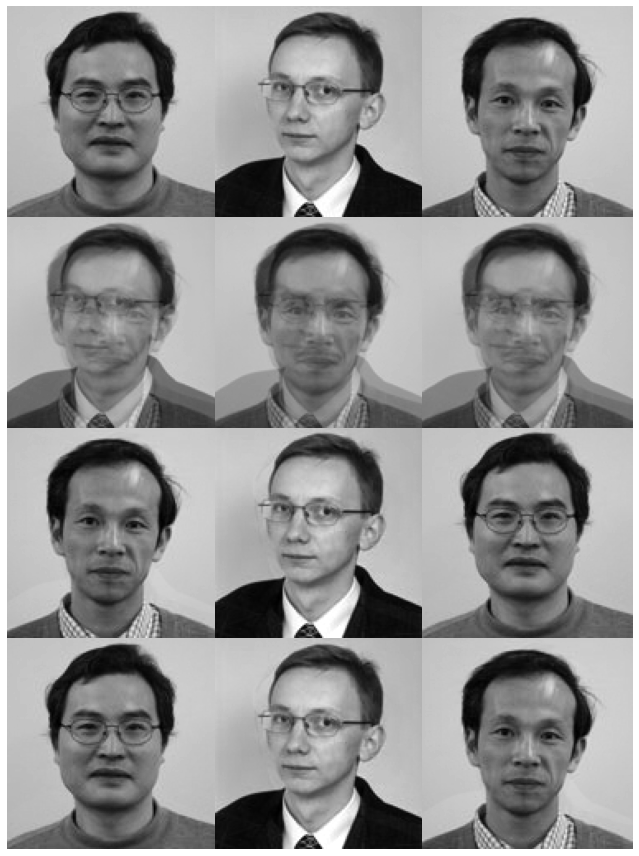

In [ ]:
mix_scientists(M=3, figsize=(9, 9), svd_solver='numpy', show=False)
mix_scientists(M=3, figsize=(9, 9), svd_solver='scipy', show=False)
mix_scientists(M=3, figsize=(9, 9), svd_solver='scipy.sparse', show=True)

--------------Algorithm output--------------
[ 0:00:00.000018] Generating (C, d) affine set
[ 0:00:06.306735] (C, d) affine set found
[ 0:00:06.800018] Starting iter 1
[ 0:00:07.144590] Searching LP solution
[ 0:00:07.248145] Found LP solution: [3928.77849459  162.64027296], value = -889.3066938603909
[ 0:00:07.248948] Searching LP solution
[ 0:00:07.323865] Found LP solution: [ 2038.41439699 -4450.00440546], value = 3285.860788482432
[ 0:00:07.325777] Checking if extreme point: [3928.77849459  162.64027296]
[ 0:00:07.327569] Checking if extreme point: [ 2038.41439699 -4450.00440546]
[ 0:00:07.348408] 2 extreme points found
[ 0:00:07.355256] Starting iter 2
[ 0:00:07.357273] Searching LP solution
[ 0:00:07.459308] Found LP solution: [ 2963.31501257 -4271.15682564], value = -104.13796978776008
[ 0:00:07.460294] Searching LP solution
[ 0:00:07.535434] Found LP solution: [-5213.48006058  2104.34299556], value = 1215.2634606649112
[ 0:00:07.537502] 2 extreme points found
[ 0:00:07.538366] 

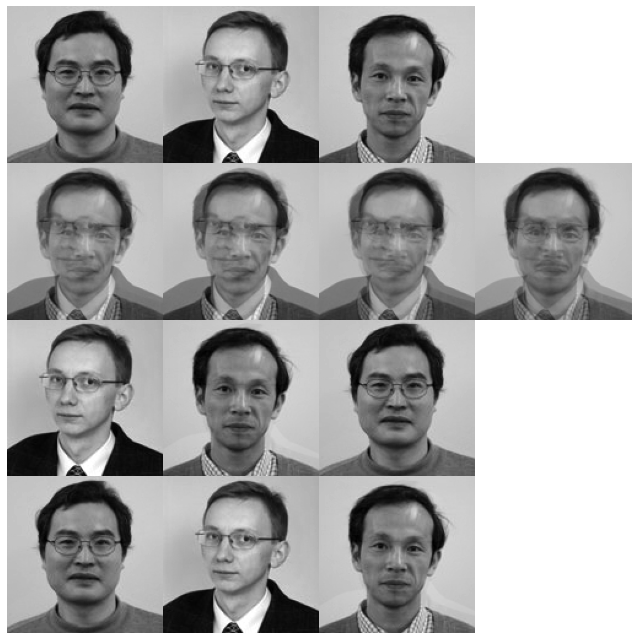

In [ ]:
mix_scientists(M=4, figsize=(9, 9), svd_solver='numpy', show=False)
mix_scientists(M=4, figsize=(9, 9), svd_solver='scipy', show=False)
mix_scientists(M=4, figsize=(9, 9), svd_solver='scipy.sparse', show=True)

--------------Algorithm output--------------
[ 0:00:00.000018] Generating (C, d) affine set
[ 0:00:06.723490] (C, d) affine set found
[ 0:00:07.229527] Starting iter 1
[ 0:00:07.571063] Searching LP solution
[ 0:00:07.678450] Found LP solution: [ 4274.24954717 -2692.60092733], value = -20304.033191300165
[ 0:00:07.681851] Searching LP solution
[ 0:00:07.762171] Found LP solution: [-5557.46969704   649.58197919], value = -4626.57232022785
[ 0:00:07.764203] Checking if extreme point: [ 4274.24954717 -2692.60092733]
[ 0:00:07.765965] Checking if extreme point: [-5557.46969704   649.58197919]
[ 0:00:07.787201] 2 extreme points found
[ 0:00:07.791595] Starting iter 2
[ 0:00:07.793659] Searching LP solution
[ 0:00:07.886615] Found LP solution: [3684.22867158 2043.17884058], value = -802.9902700995896
[ 0:00:07.887822] Searching LP solution
[ 0:00:08.011263] Found LP solution: [ 3534.70049938 -2939.5522054 ], value = 88.23681290101112
[ 0:00:08.013421] 2 extreme points found
[ 0:00:08.013539]

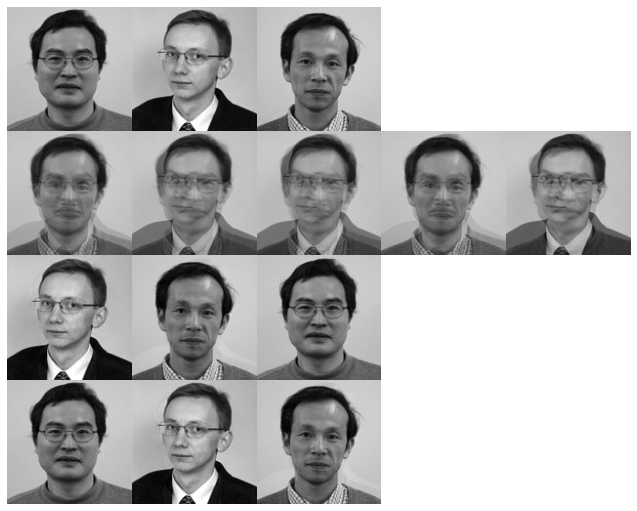

In [ ]:
mix_scientists(M=5, figsize=(9, 9), svd_solver='numpy', show=False)
mix_scientists(M=5, figsize=(9, 9), svd_solver='scipy', show=False)
mix_scientists(M=5, figsize=(9, 9), svd_solver='scipy.sparse', show=True)

В результате видим, что `scipy.sparse.linalg.svds` в данном случае работает сильно быстрее, будем далее пользоваться им

#### Поиграем теперь с рандомными (серыми) изображениями из датасета Linnaeus

In [ ]:
def mix_random_linnaeus_grey(N=3, M=3, figsize=(12, 12), svd_solver='numpy', show=True, verbose=True):
    real = np.array([np.asarray(Image.open(path).convert('L')) for path in np.random.choice(linna_image_paths, N, replace=False)])
    images = np.append(real, np.ones(shape=(M - N, 128, 128))*255, axis=0)

    alphas = np.random.uniform(size=(M, N))
    alphas = alphas / alphas.sum(axis=1)[:, np.newaxis]
    mixes = np.tensordot(alphas, real, axes=(1, 0))

    if verbose:
        print("--------------Algorithm output--------------")
    result = CAMNS_LP(mixes.reshape(M, 128*128).T, N, svd_solver=svd_solver, verbose=verbose).T.reshape(N, 128, 128)
    if verbose:
        print("-------------------End----------------------\n\n")

    dists, inds = find_closests(real.reshape(N, 128*128).T, result.reshape(N, 128*128).T)

    images = np.append(images, mixes, axis=0)
    images = np.append(images, result, axis=0)
    images = np.append(images, np.ones(shape=(M - N, 128, 128))*255, axis=0)
    images = np.append(images, result[inds, :, :], axis=0)
    images = np.append(images, np.ones(shape=(M - N, 128, 128))*255, axis=0)

    if show:
        show_images(images, adjust=True, figsize=figsize, shape=(4, M), imshow_params={'cmap':'gray', 'vmin':0.0, 'vmax':255.0})

--------------Algorithm output--------------
[ 0:00:00.000018] Generating (C, d) affine set
[ 0:00:00.008219] (C, d) affine set found
[ 0:00:00.328842] Starting iter 1
[ 0:00:00.675206] Searching LP solution
[ 0:00:00.754757] Found LP solution: [ 6756.00520141 -2446.50972531], value = -17653.302133532616
[ 0:00:00.755039] Searching LP solution
[ 0:00:00.842001] Found LP solution: [-3493.01588618  5225.64117109], value = 5733.204387138458
[ 0:00:00.843600] Checking if extreme point: [ 6756.00520141 -2446.50972531]
[ 0:00:00.845262] Checking if extreme point: [-3493.01588618  5225.64117109]
[ 0:00:00.865589] 2 extreme points found
[ 0:00:00.865806] Starting iter 2
[ 0:00:00.867969] Searching LP solution
[ 0:00:00.962509] Found LP solution: [4506.91821965 1126.21101844], value = -457.3650422543018
[ 0:00:00.963164] Searching LP solution
[ 0:00:01.049989] Found LP solution: [-5215.19761623 -7072.31489132], value = 3289.523913642469
[ 0:00:01.052337] Checking if extreme point: [-5215.197616

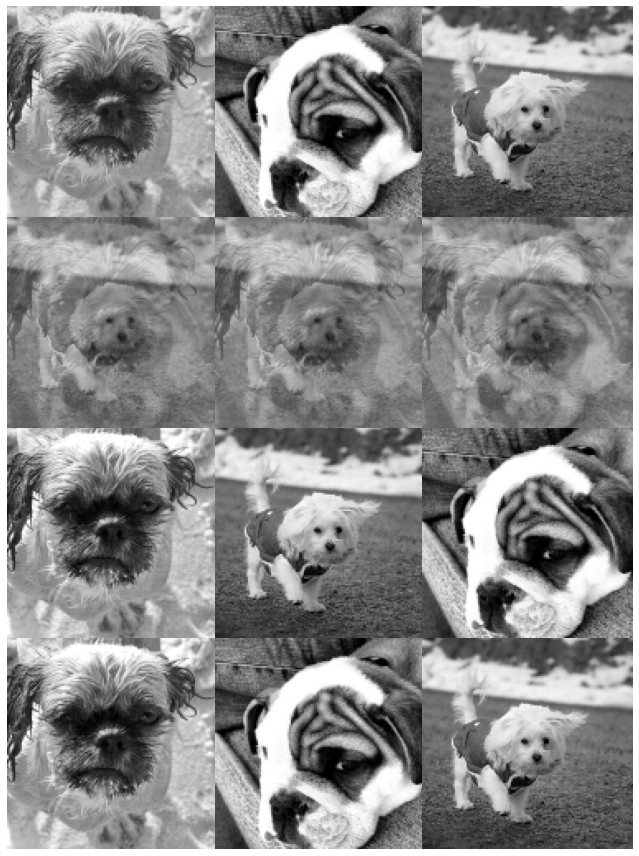

In [ ]:
mix_random_linnaeus_grey(N=3, M=3, figsize=(9, 9), svd_solver='scipy.sparse')

--------------Algorithm output--------------
[ 0:00:00.000025] Generating (C, d) affine set
[ 0:00:00.010274] (C, d) affine set found
[ 0:00:00.319667] Starting iter 1
[ 0:00:00.657880] Searching LP solution
[ 0:00:00.886042] Found LP solution: [ 2949.63215186 -3772.01258688 -3349.1598006 ], value = -6336.57764670094
[ 0:00:00.887337] Searching LP solution
[ 0:00:00.999683] Found LP solution: [-4768.40414001 -1310.56016598  5482.00857564], value = 2471.9188228176863
[ 0:00:01.000969] Checking if extreme point: [ 2949.63215186 -3772.01258688 -3349.1598006 ]
[ 0:00:01.128109] 1 extreme points found
[ 0:00:01.129289] Starting iter 2
[ 0:00:01.132631] Searching LP solution
[ 0:00:01.277168] Found LP solution: [-4078.44351092  4107.48552801 -5660.23118202], value = -19384.12514765747
[ 0:00:01.280781] Searching LP solution
[ 0:00:01.388512] Found LP solution: [5278.9257743  2810.01809376 1803.82791341], value = 12228.708269717994
[ 0:00:01.395946] Checking if extreme point: [-4078.44351092 

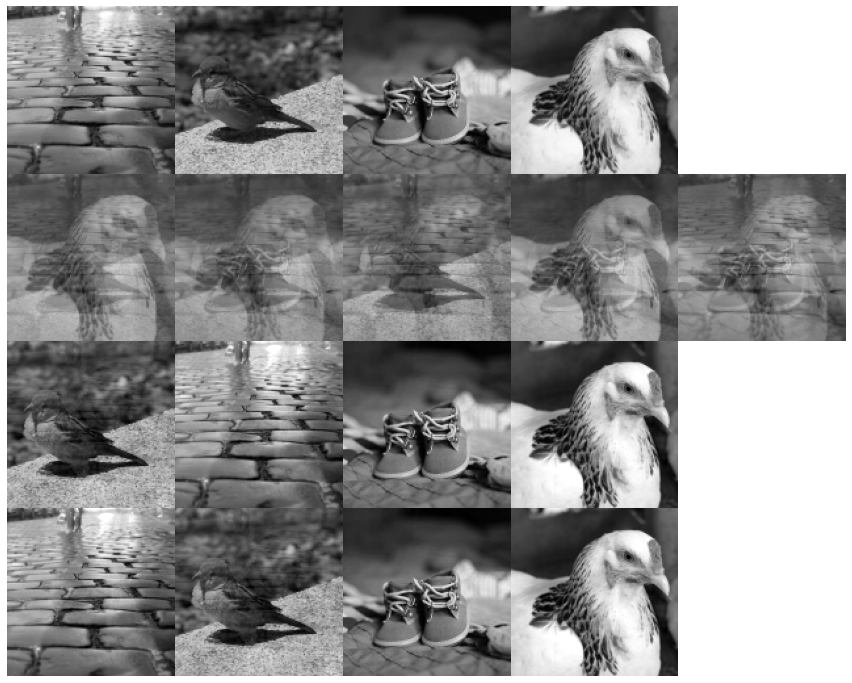

In [ ]:
mix_random_linnaeus_grey(N=4, M=5, figsize=(12, 12), svd_solver='scipy.sparse')

--------------Algorithm output--------------
[ 0:00:00.000024] Generating (C, d) affine set
[ 0:00:00.006668] (C, d) affine set found
[ 0:00:00.315898] Starting iter 1
[ 0:00:00.655345] Searching LP solution
[ 0:00:00.855870] Found LP solution: [-3870.51365848 -5355.61650776 -3242.25159076 -3157.81433195], value = -18666.82457524787
[ 0:00:00.857942] Searching LP solution
[ 0:00:01.009757] Found LP solution: [1515.3544675  3551.66219029 3732.94237444 3230.35066583], value = 3863.7690114406696
[ 0:00:01.011450] Checking if extreme point: [-3870.51365848 -5355.61650776 -3242.25159076 -3157.81433195]
[ 0:00:01.013003] Checking if extreme point: [1515.3544675  3551.66219029 3732.94237444 3230.35066583]
[ 0:00:01.032505] 2 extreme points found
[ 0:00:01.032665] Starting iter 2
[ 0:00:01.034640] Searching LP solution
[ 0:00:01.236630] Found LP solution: [ 3117.40334417 -8190.9394393   1536.83037067 -3811.95796548], value = -8398.314024786596
[ 0:00:01.237397] Searching LP solution
[ 0:00:01.

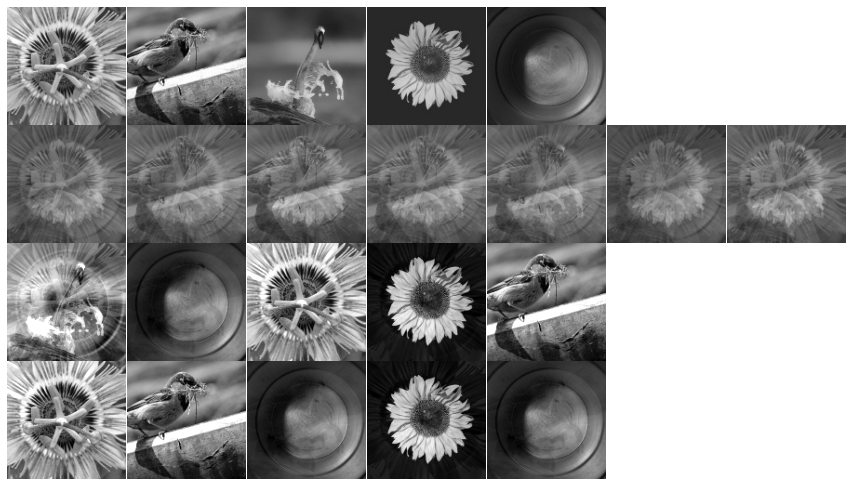

In [ ]:
mix_random_linnaeus_grey(N=5, M=7, figsize=(12, 12), svd_solver='scipy.sparse')

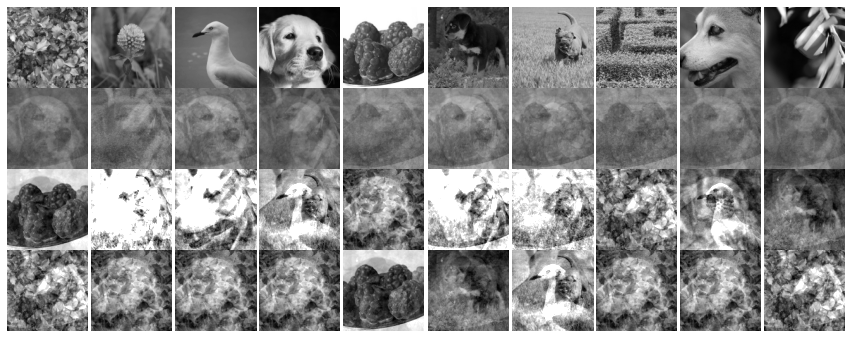

In [ ]:
mix_random_linnaeus_grey(N=10, M=10, figsize=(12, 12), svd_solver='scipy.sparse', verbose=False)

Видим, что при M равным или лишь чуть больше N, алгоритм отрабатывает не очень. Посмотрим, что будет, если увеличить значение M

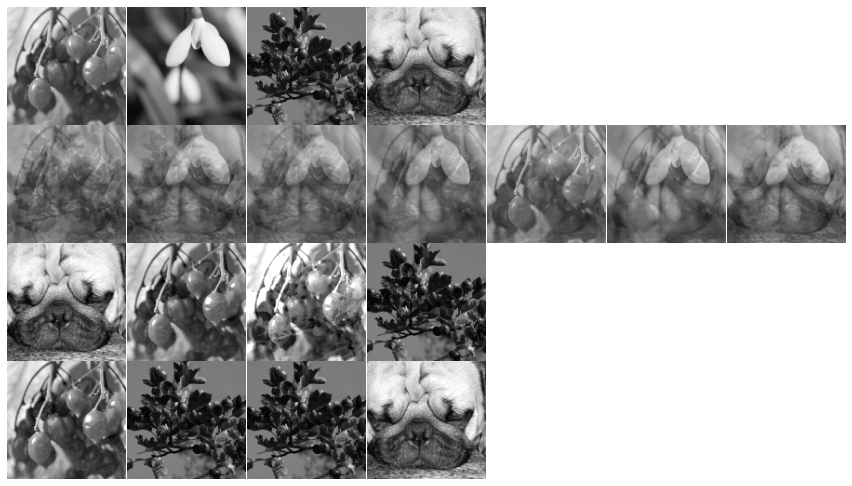

In [ ]:
mix_random_linnaeus_grey(N=4, M=7, figsize=(12, 20), svd_solver='scipy.sparse', verbose=False)

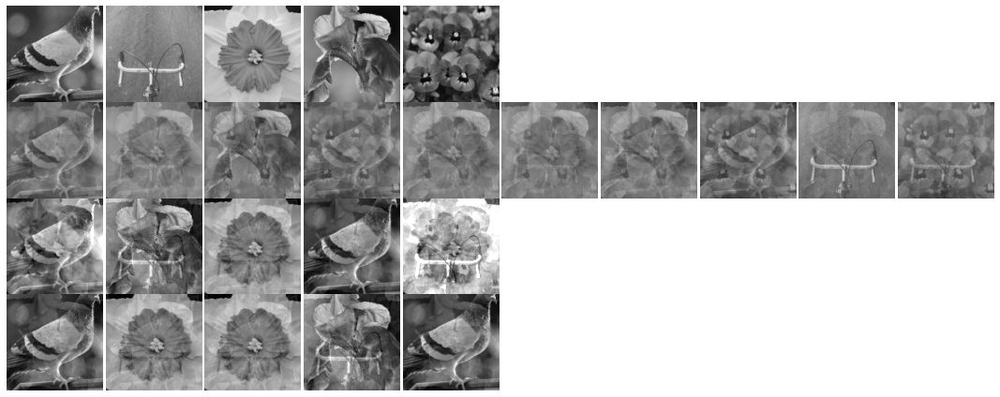

In [ ]:
mix_random_linnaeus_grey(N=5, M=10, figsize=(15, 25), svd_solver='scipy.sparse', verbose=False)

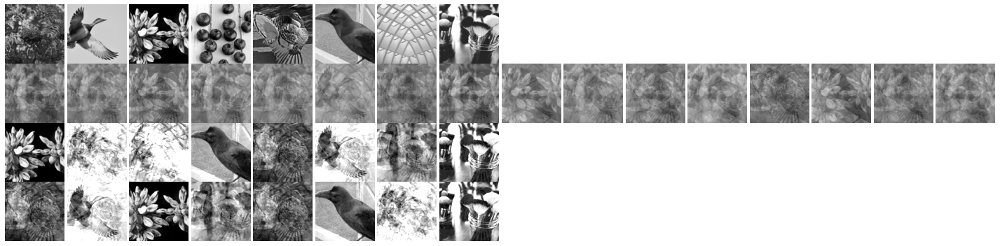

In [ ]:
mix_random_linnaeus_grey(N=8, M=16, figsize=(20, 25), svd_solver='scipy.sparse', verbose=False)

#### Потрогаем произвольные цветные изображения из датасета Linnaeus

PS. Почему-то ноутбук бесится (выжирает память и довольный умирает), если использовать все изображения целиком, поэтому приходится извращаться и уменьшать размер изображения для нормальной работы

Судя по всему, это происходит где-то на svd, ибо там могут получаться большие матрицы при поиска декомпозиции

In [ ]:
def mix_random_linnaeus_color(N=3, M=3, figsize=(12, 12), im_shape=(96, 96), svd_solver='numpy', verbose=True, show=True):
    imc_shape = (*im_shape, 3)
    flat_shape = np.prod(imc_shape)

    real = np.array([np.asarray(Image.open(path).resize(im_shape)) / 255 for path in np.random.choice(linna_image_paths, N, replace=False)])
    images = np.append(real, np.ones(shape=(M - N, *imc_shape)), axis=0)

    alphas = np.random.uniform(size=(M, N))
    alphas = alphas / alphas.sum(axis=1)[:, np.newaxis]
    mixes = np.tensordot(alphas, real, axes=(1, 0))

    if verbose:
        print("--------------Algorithm output--------------")
    result = CAMNS_LP(mixes.reshape(M, flat_shape).T, N, svd_solver=svd_solver, verbose=verbose).T.reshape(N, *imc_shape)
    if verbose:
        print("-------------------End----------------------\n\n")
    result = np.clip(result, 0, 1)

    dists, inds = find_closests(real.reshape(N, flat_shape).T, result.reshape(N, flat_shape).T)

    images = np.append(images, mixes, axis=0)
    images = np.append(images, result, axis=0)
    images = np.append(images, np.ones(shape=(M - N, *imc_shape)), axis=0)
    images = np.append(images, result[inds, :, :], axis=0)
    images = np.append(images, np.ones(shape=(M - N, *imc_shape)), axis=0)

    if show:
        show_images(images, adjust=True, figsize=figsize, shape=(4, M))

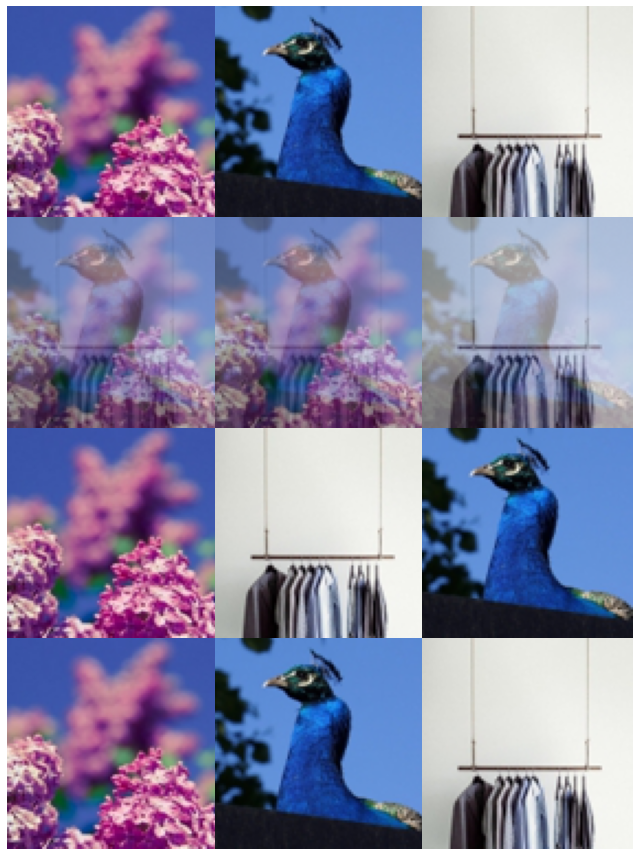

In [ ]:
mix_random_linnaeus_color(
    N=3,
    M=3,
    figsize=(9, 9),
    im_shape=(96, 96),
    svd_solver='scipy.sparse',
    verbose=False
)

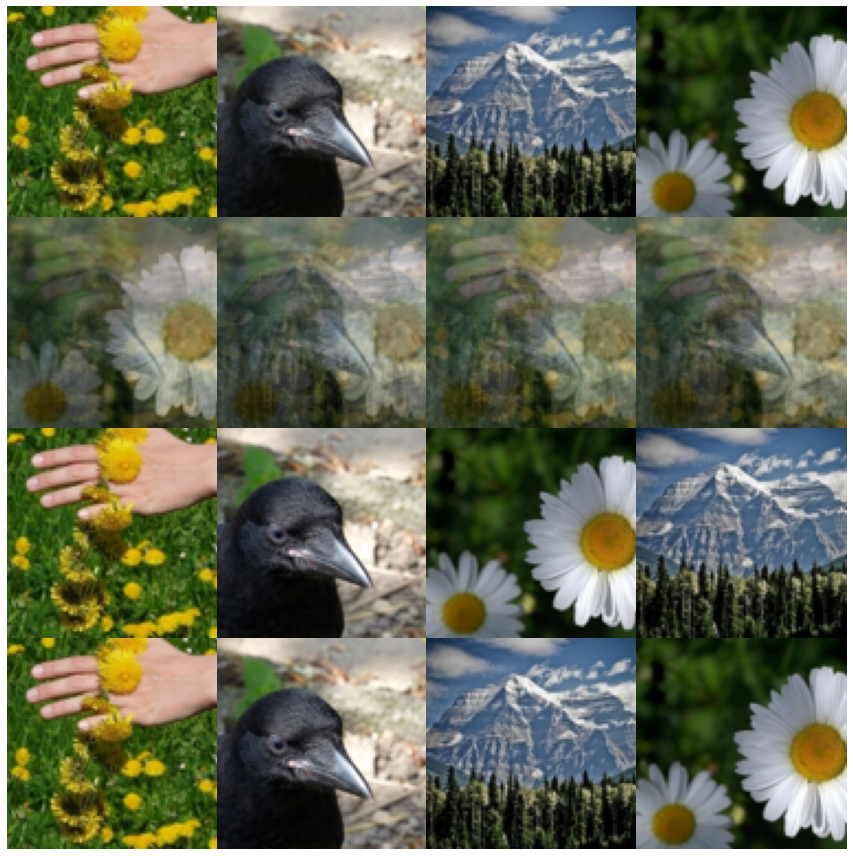

In [ ]:
mix_random_linnaeus_color(
    N=4,
    M=4,
    figsize=(12, 12),
    im_shape=(96, 96),
    svd_solver='scipy.sparse',
    verbose=False
)

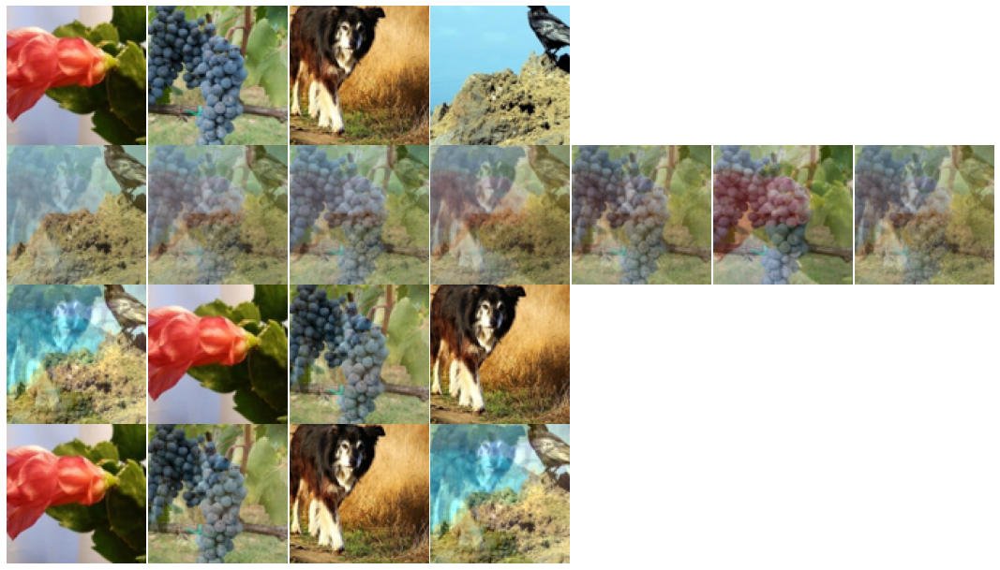

In [ ]:
mix_random_linnaeus_color(
    N=4,
    M=7,
    figsize=(15, 20),
    im_shape=(96, 96),
    svd_solver='scipy.sparse',
    verbose=False
)

#### А теперь сравним время работы при больших N и M

P.S. С увеличением N и M все чаще случаются ситуации с плохими множествами C, d, что возможно случается из-за частых проблем с зависимостями смесей данных

In [ ]:
start = datetime.now()
mix_random_linnaeus_color(
    N=20,
    M=40,
    figsize=(15, 20),
    im_shape=(64, 64),
    svd_solver='numpy',
    verbose=False,
    show=False
)
end = datetime.now()
print(f"Finished in {end - start}")

Finished in 0:00:27.653964


In [ ]:
start = datetime.now()
mix_random_linnaeus_color(
    N=20,
    M=40,
    figsize=(15, 20),
    im_shape=(64, 64),
    svd_solver='scipy',
    verbose=False,
    show=False
)
end = datetime.now()
print(f"Finished in {end - start}")

Finished in 0:00:26.266336


In [ ]:
start = datetime.now()
mix_random_linnaeus_color(
    N=20,
    M=40,
    figsize=(15, 20),
    im_shape=(64, 64),
    svd_solver='scipy.sparse',
    verbose=False,
    show=False
)
end = datetime.now()
print(f"Finished in {end - start}")

Finished in 0:00:15.584143


### Результаты

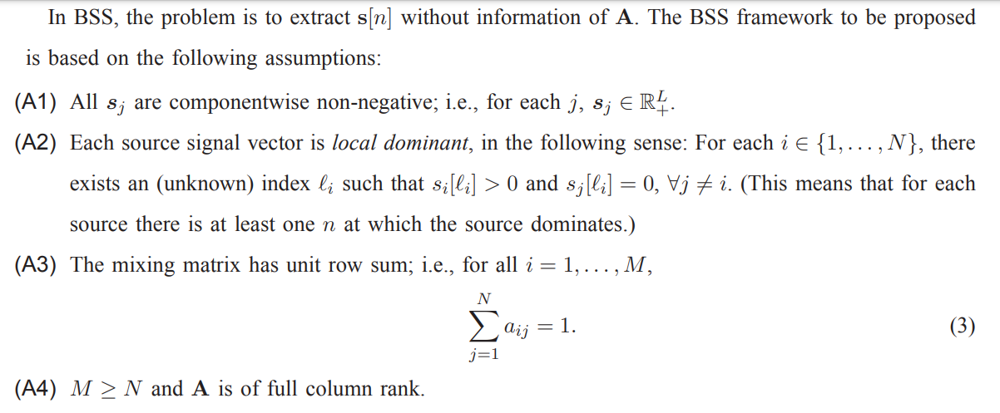

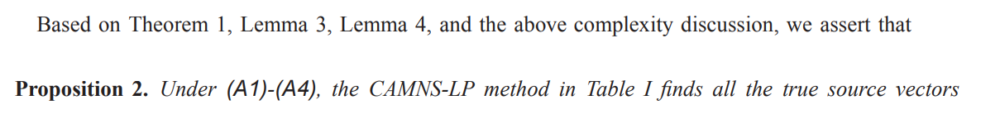

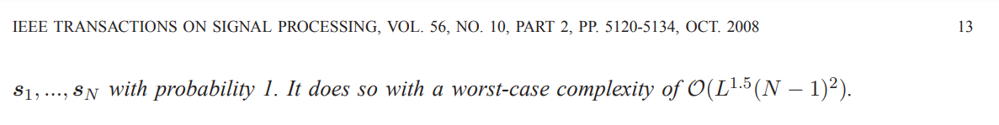

Алгоритм в целом очень классно работает, не используя никаких нейронок, сложных ML моделей и т.п., а только решая некоторую не очень сложную задачу оптимизации

При этом, несмотря на утверждения выше, он не всегда справляется с вытаскиванием всех исходных картинок корректно. Происходит это скорее всего потому, что 
* Может не выполняться A2 (про local dominant) так как картинки произвольные, чаще всего, везде имеют какой-то ненулевой цвет

* Может не выполняться A4, так как смеси генерируются рандомно, как следствие - могут случаться линейно зависимые смеси и ранг матрицы наблюдений будет ниже N. От этого спасает увеличение числа смесей картинок. Однако и тогда могут случаться ситуации, когда из-за зависимостей в данных поиск максимума или минимума ломается

Сответственно про такие случаи нельзя сказать, может и должен ли алгоритм работать корректно. При этом, с увеличением числа наблюдений алгоритм начинает работать лучше и давать лучшие показатели, т.к. информации для обработки становится больше, что с больошой вероятностью помогает справиться с A4 и возможно как-то улучшает ситуацию в A2

Кроме того, с временем работы помогает разобраться использование `scipy.sparse.linalg.svds` вместо `scipy.linalg.svd` и `numpy.linalg.svd`, работающее несколько быстрее.

_________________________________________________________________

(результат 2 - получено много забавных фотоколлажей с животными в стиле "Вьетнамские флешбеки")

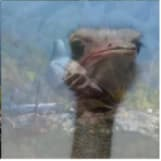